In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from numpy.random import RandomState
from collections import defaultdict
from scipy import stats
from permute.core import one_sample

from utils import *
from graph_effects_utils import *

import pickle

prng = RandomState(42)
sns.set_style('whitegrid')
sns.set_context('paper', font_scale=1.5)

# Calculate effect sizes, p-values, CIs

In [2]:
# Load data
df = load_to_df('data/twitter_data.json')
df = df[df['shown_to_user']==True].reset_index(drop=True)

100%|██████████| 1730/1730 [00:03<00:00, 459.48it/s]


In [3]:
# Calculate effects for engagement timeline
eng_effects = get_effects(df, Timeline.ENGAGEMENT)

In [11]:
groupings_and_groups = {
    "user_race": ['American Indian or Alaska Native', 'Asian', 'Black or African American', 'Native Hawaiian or Pacific Islander', 'White', 'Other'],
    "user_ethnicity": ['Spanish', 'Hispanic', "Latino", "None of these"],
    "user_annual_household_income": ['Less than $25,000', '$25,000 - $50,000', '$50,000 - $100,000', '$100,000 - $200,000', 'More than $200,000', 'Prefer not to say'],
    "user_age_group": ['18-24 years old', '25-34 years old', '35-44 years old', '45-54 years old', '55-64 years old', '65-74 years old', '75 years or older'],
    "user_education_level": ['Some high school', 'High school graduate', 'Associate degree', "Bachelor's degree", "Master's degree or above", 'Prefer not to answer', 'Other'],
    "user_gender": ['Woman', 'Man', 'Non-binary', 'Other'],
    "user_main_why_tweet": ['A way to stay informed', 'Entertainment', 'Keeping me connected to other people', "It's useful for my job or school", 'Lets me see different points of view', 'A way to express my opinions'],
    "user_ideo_political_party": ["Republican", "Democrat", "Independent", "Something else"],
    "user_ideo_political_leaning": ['Far left', 'Left', 'Moderate', 'Right', 'Far right', 'Other'],
    "content_category": ['Entertainment', 'News', 'Hobbies', 'Politics', 'Work', 'Other']
}

groupings = ['user_ethnicity', 
             'user_ideo_political_leaning', 
             'content_category', 
             'user_ideo_political_party', 
             'user_age_group', 
             'user_education_level', 
             'user_race', 
             'user_gender', 
             'user_main_why_tweet', 
             'user_annual_household_income']

In [ ]:
grouping_analyses = defaultdict(dict)
for grouping in tqdm.tqdm(groupings):
    print(grouping)
    
    # If each user can have multiple values, then we have pre-defined lists of values above
    groups = groupings_and_groups[grouping]

    for group in groups:
        print(group)
        
        if grouping in groupings_and_groups:
            # If each user can have multiple values, then we check whether the group is in the list of values
            group_df = df[df[grouping].apply(lambda x: group in x)]    
        else:
            # Otherwise, we just filter by the group
            group_df = df[df[grouping] == group]

        print(len(group_df))
        
        grouping_analyses[grouping][group] = get_effects(group_df, Timeline.ENGAGEMENT)

In [13]:
# Save grouping_analysis as pickle
# with open("data/grouping_analyses.pickle", "wb") as handle:
#     pickle.dump(dict(grouping_analyses), handle, protocol=pickle.HIGHEST_PROTOCOL)

# Load grouping_analysis from pickle
with open("data/grouping_analyses.pickle", "rb") as handle:
    grouping_analyses = pickle.load(handle)

In [14]:
grouping_analyses['user_ideo_political_leaning'].keys()

dict_keys(['Far left', 'Left', 'Moderate', 'Right', 'Far right', 'Other'])

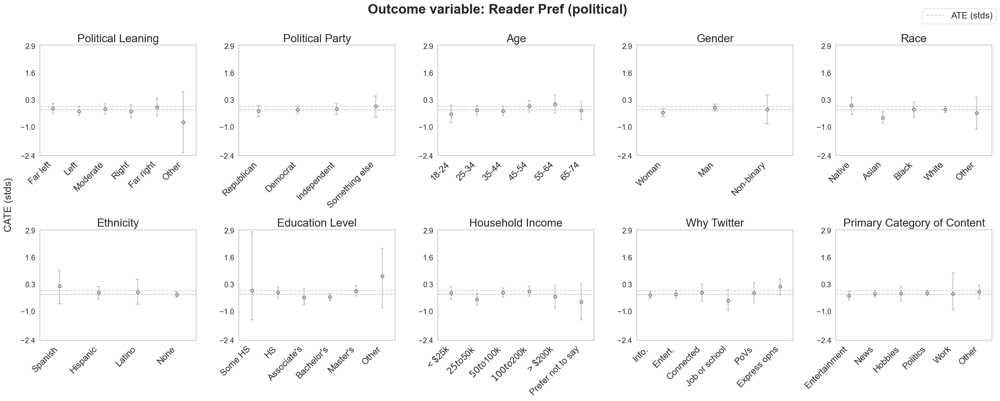

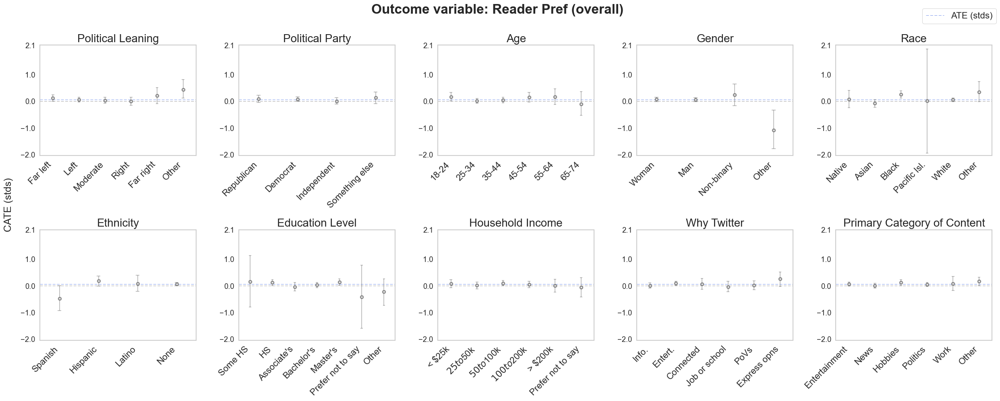

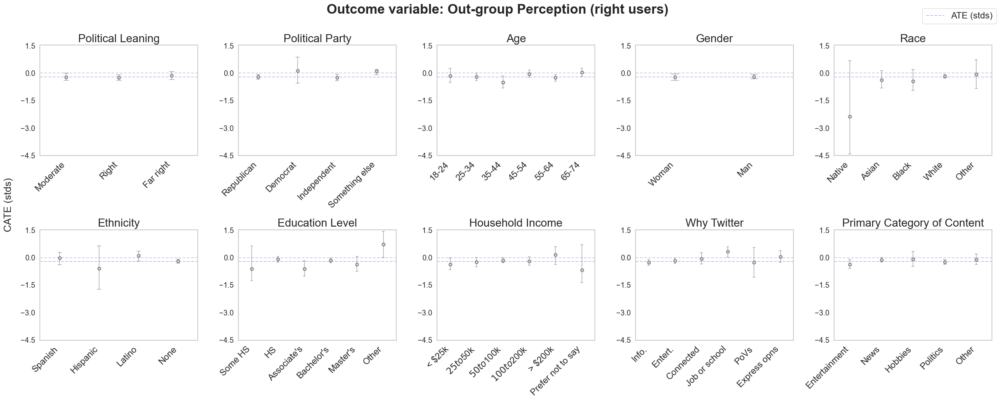

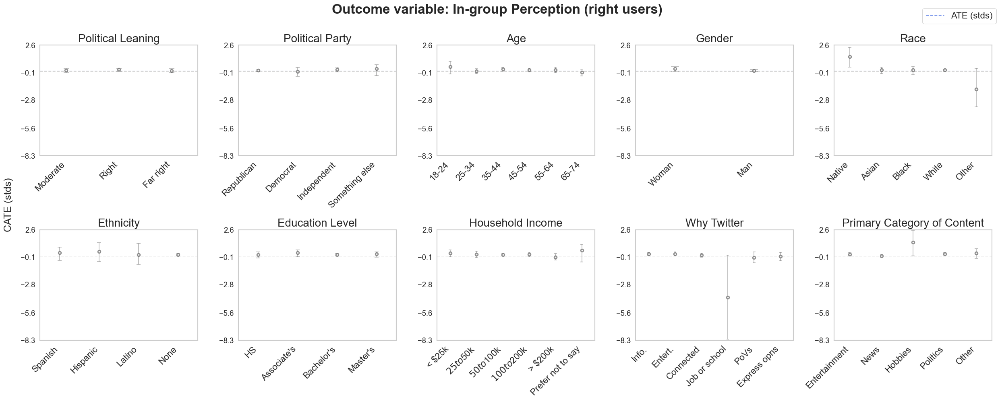

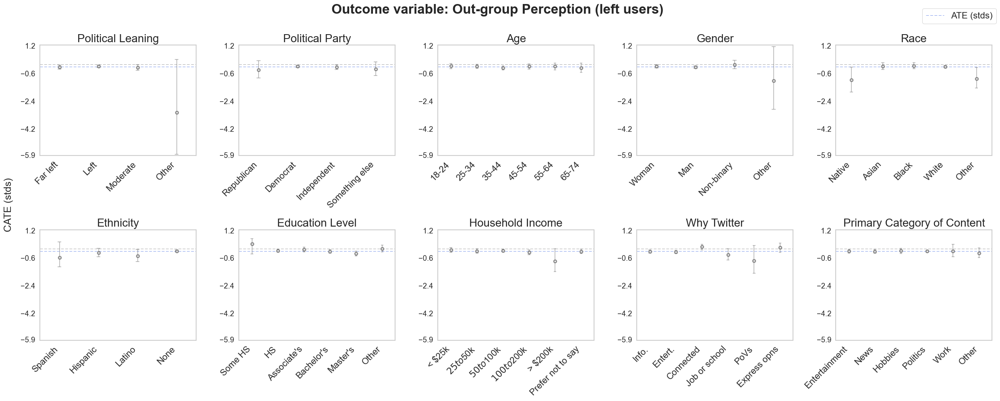

...

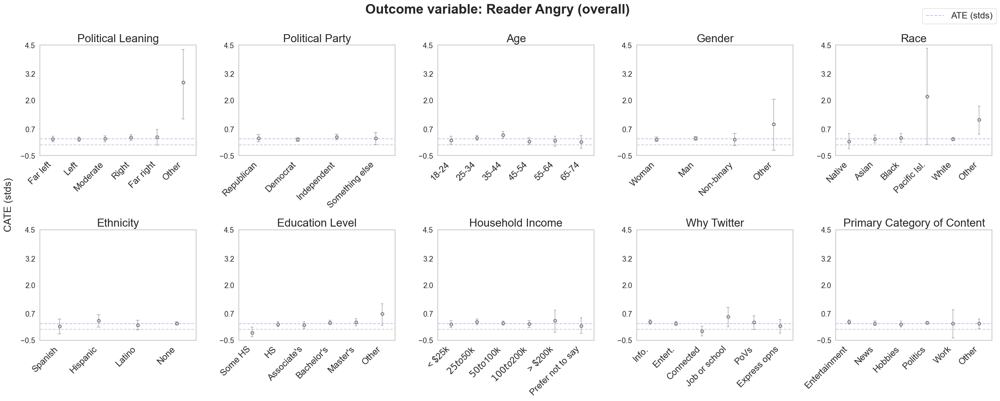

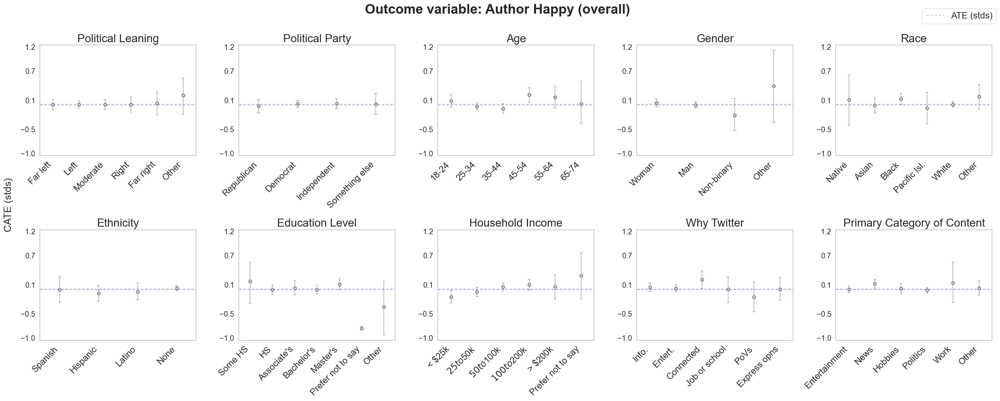

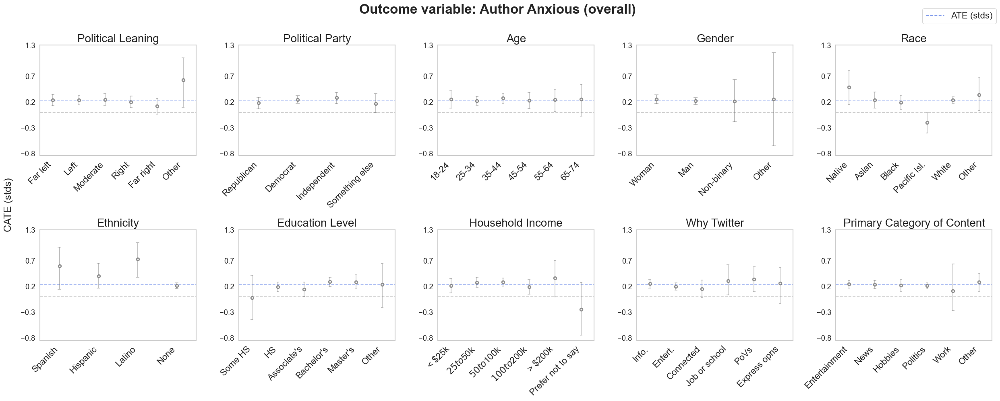

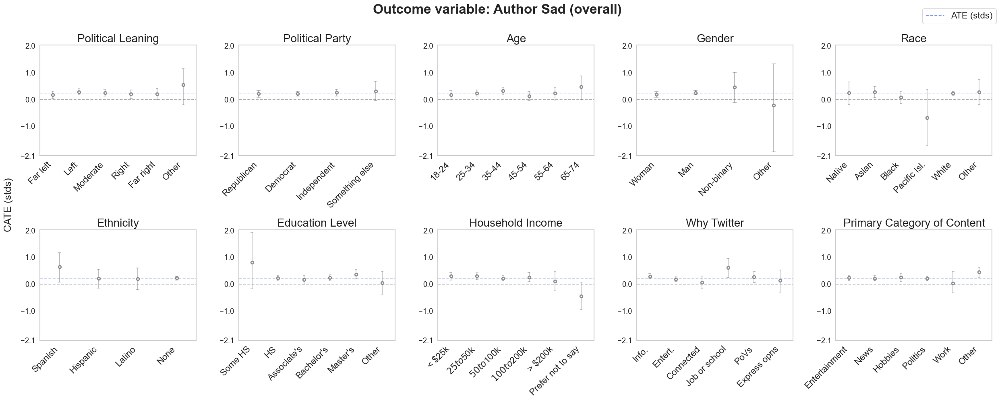

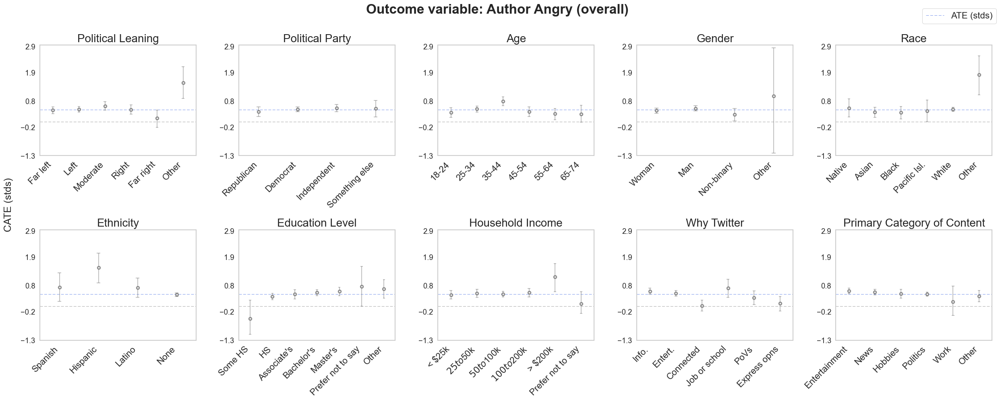

In [17]:
def format_data_and_plot(outcome, grouping_analyses, eng_effects):
    data = {}
    for grouping, groups_dict in grouping_analyses.items():
        data[grouping] = {}

        for group, group_df in groups_dict.items():
            df = group_df[group_df["Outcome"] == outcome]
            assert len(df) == 1
            effect = df["Standardized Effect"].values[0]
            ci = df["Confidence Interval (standardized)"].values[0]
            data[grouping][group] = (effect, ci)

    # Reorder keys to be alphabetical
    data = {k: data[k] for k in [
        "user_ideo_political_leaning",
        "user_ideo_political_party",
        "user_age_group",
        "user_gender",
        "user_race",
        "user_ethnicity",
        "user_education_level",
        "user_annual_household_income",
        "user_main_why_tweet",
        "content_category"]}

    plot_heterogeneous(data, eng_effects, outcome)

outcomes = grouping_analyses['user_ideo_political_party']['Republican']['Outcome'].unique()
for outcome in outcomes:
    format_data_and_plot(outcome, grouping_analyses, eng_effects)

In [18]:
grouping_analyses["user_main_why_tweet"].keys()

dict_keys(['A way to stay informed', 'Entertainment', 'Keeping me connected to other people', "It's useful for my job or school", 'Lets me see different points of view', 'A way to express my opinions'])

In [19]:
ordered_outcomes = [   
    "Author Angry (overall)", "Author Sad (overall)", "Author Anxious (overall)", "Author Happy (overall)",
    "Reader Angry (overall)", "Reader Sad (overall)", "Reader Anxious (overall)", "Reader Happy (overall)",

    "Author Angry (political)",
    "Author Sad (political)",
    "Author Anxious (political)",
    "Author Happy (political)",

    "Reader Angry (political)",
    "Reader Sad (political)",
    "Reader Anxious (political)",
    "Reader Happy (political)",

    "Partisanship",
    "Out-group Animosity",
    "In-group Perception",
    "Out-group Perception",

    # "In-group Perception (left users)",
    # "Out-group Perception (left users)",
    # "In-group Perception (right users)",
    # "Out-group Perception (right users)",

    "Reader Pref (overall)", "Reader Pref (political)"
 ]

In [20]:
def plot_effects_for_grouping(grouping_analyses, grouping, ordered_outcomes, eng_effects):
    data = {}
    for outcome in ordered_outcomes:
        data[outcome] = {}
        for group, group_df in grouping_analyses[grouping].items():
            df = group_df[group_df["Outcome"] == outcome]
            assert len(df) == 1
            effect = df["Standardized Effect"].values[0]
            ci = df["Confidence Interval (standardized)"].values[0]
            data[outcome][group] = (effect, ci)


    aggregate_data = {}
    for outcome in ordered_outcomes:
        aggregate_data[outcome] = eng_effects[eng_effects["Outcome"] == outcome]["Standardized Effect"].values[0]

    title, _ = get_labels_and_title(grouping, [])
    plot_outcomes_for_grouping(data, aggregate_data, f"Outcomes by {title}", grouping)

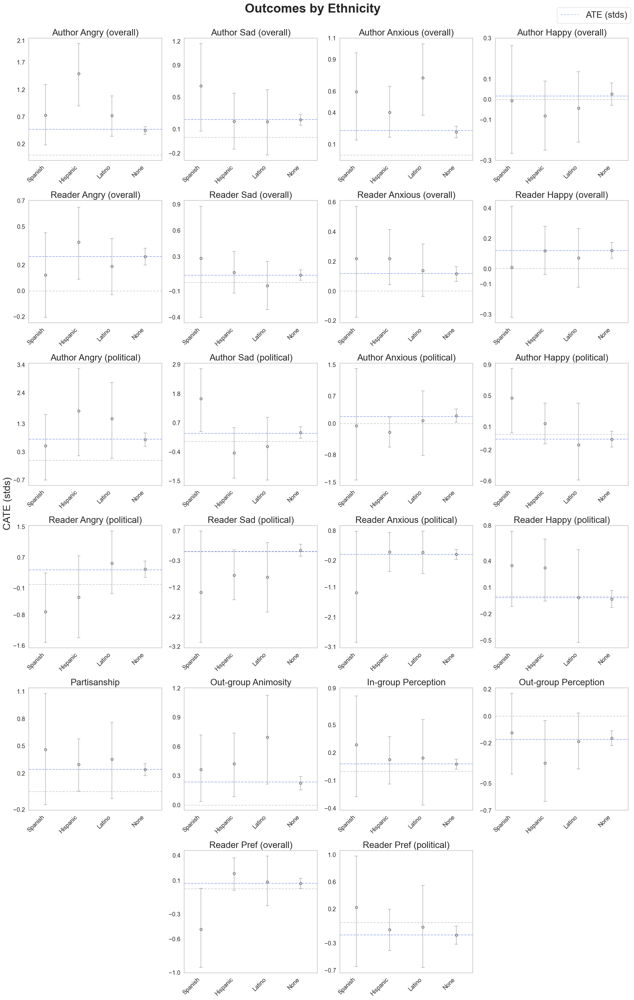

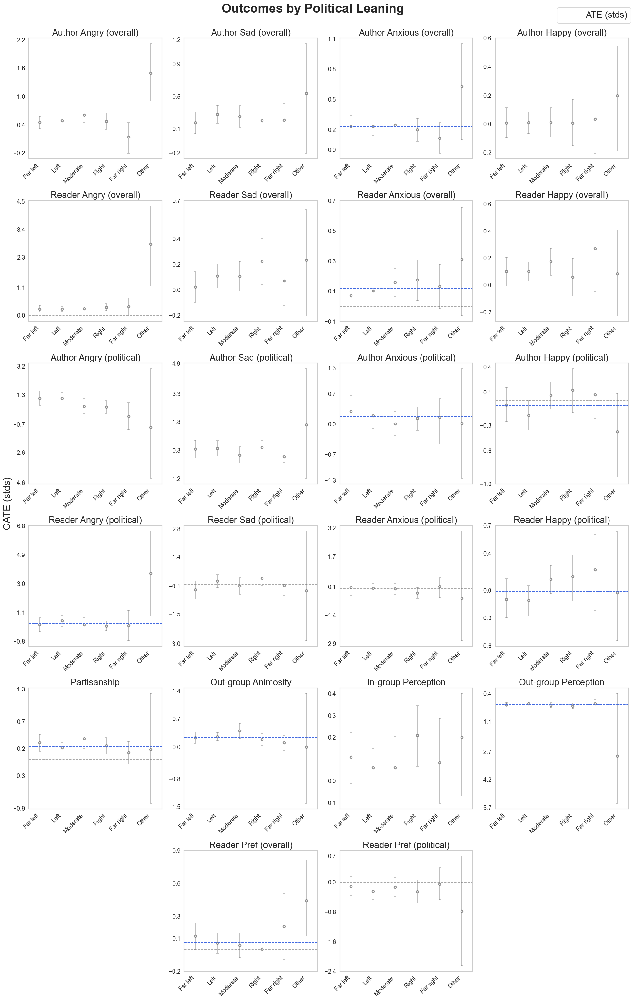

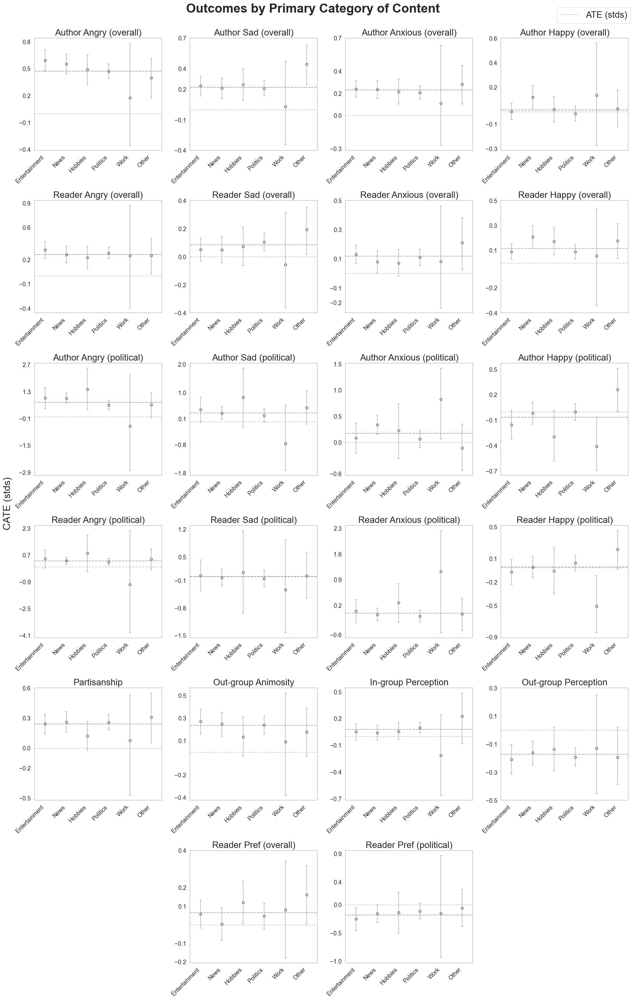

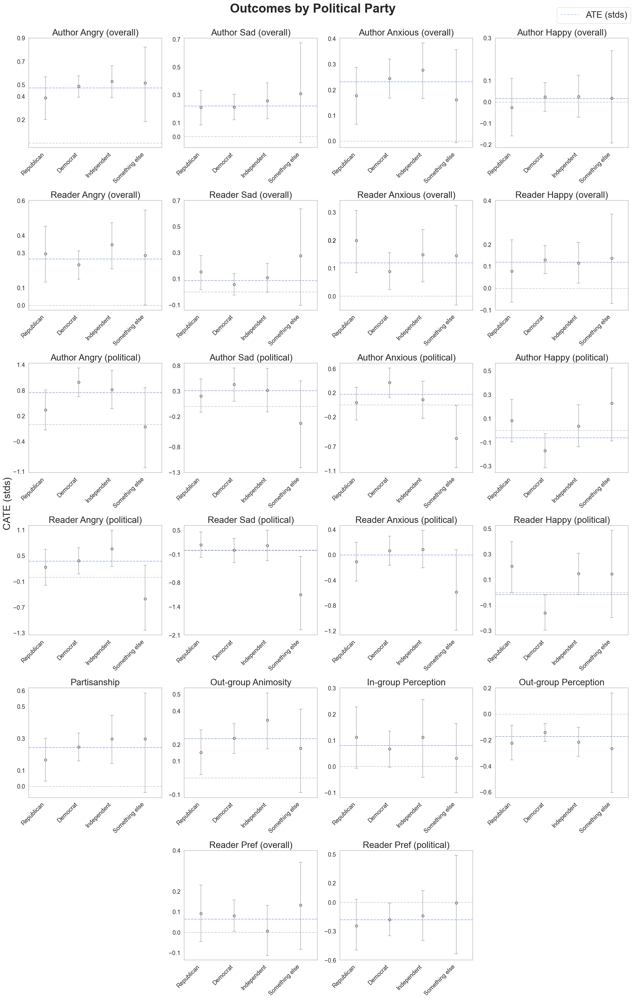

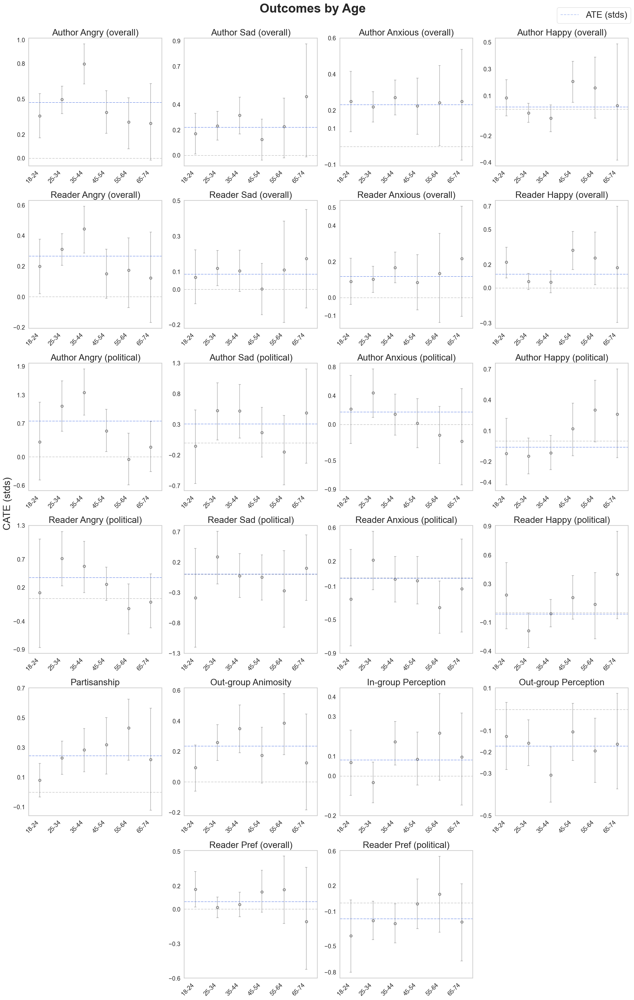

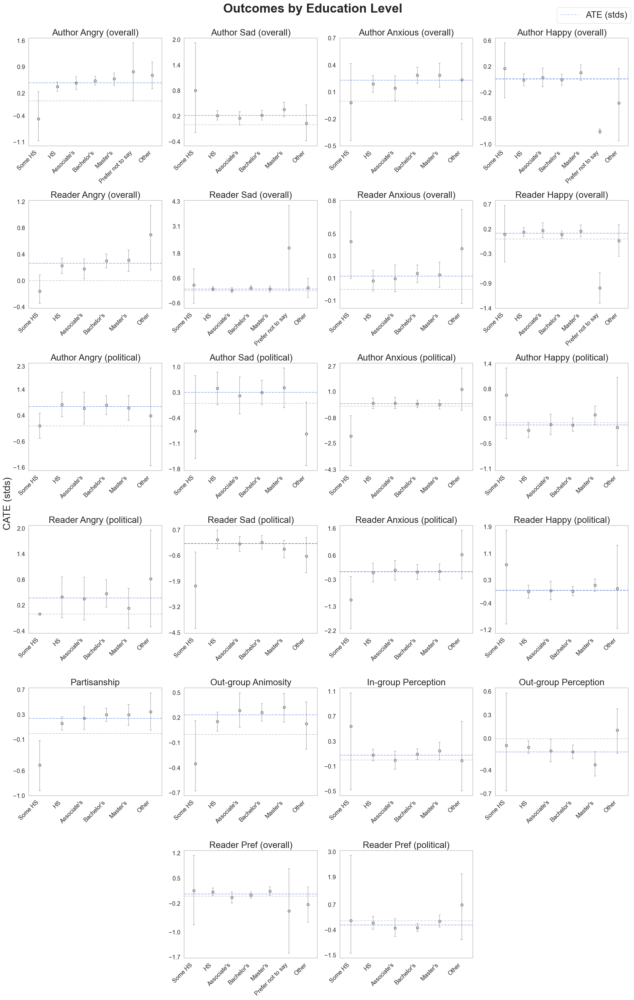

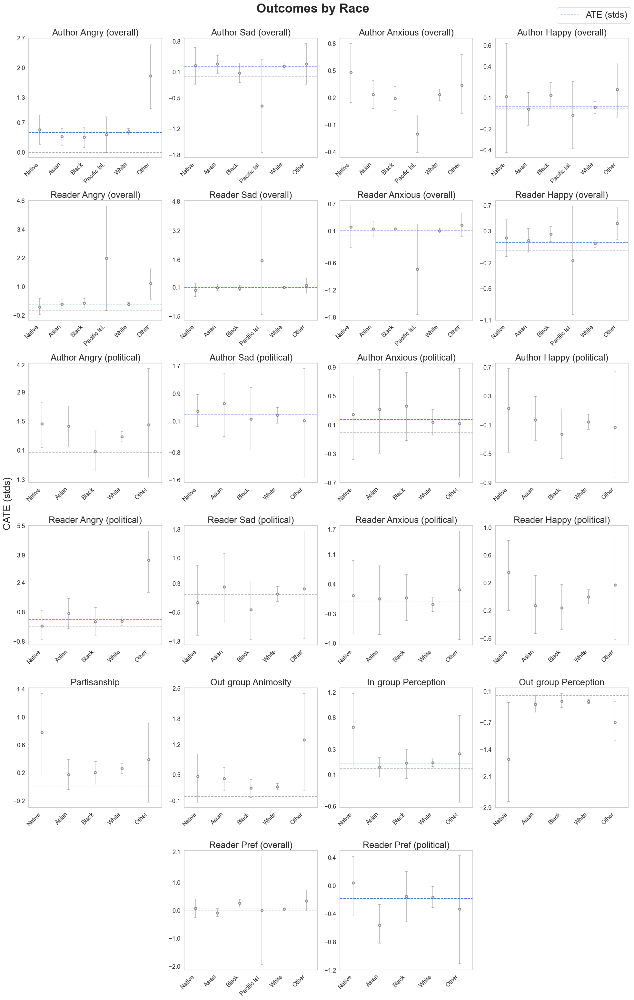

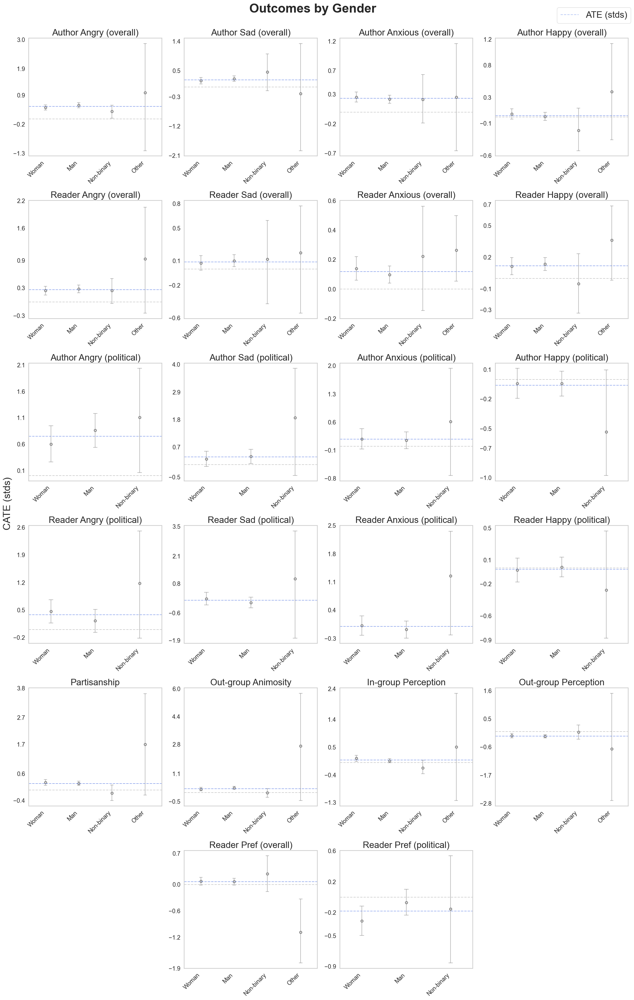

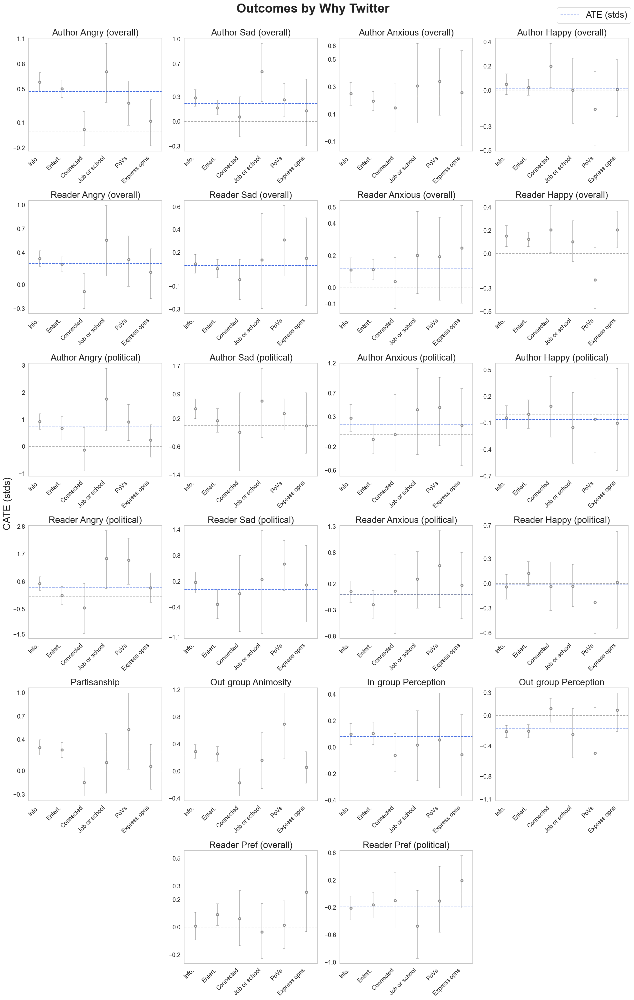

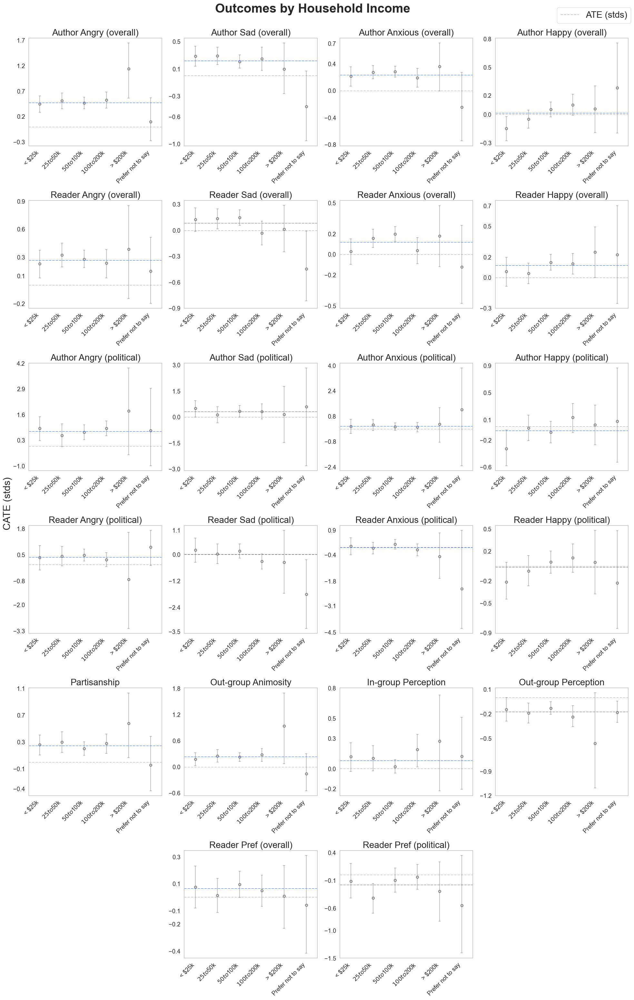

In [22]:
for grouping in groupings:
    plot_effects_for_grouping(grouping_analyses, grouping, ordered_outcomes, eng_effects)